In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import json
import os
import h5py
import sys
sys.path.append('/trinity/home/g.bobrovskih/sharp_features_in_progress/')
# from scripts.train_scripts.python_scripts.overfit import Unet, overfit_dataset, DataLoader, two_stage_unet, Classifier, DeepLabv3_plus
from sharpf.data.datasets.hdf5_datasets import DepthHDF5Dataset
from torch.utils.data import DataLoader
# from scripts.train_scripts.python_scripts.train_depths import two_heads_nn

In [2]:
high_res_quantile = 7.4776
def quantile_normalize(data):
    # mask -> min shift -> quantile

    norm_data = np.copy(data)
    mask_obj = np.where(norm_data != 0)
    mask_back = np.where(norm_data == 0)
    norm_data[mask_back] = norm_data.max() + 1.0 # new line
    norm_data -= norm_data[mask_obj].min()

    norm_data /= high_res_quantile

    return norm_data

def standartize(data):
    # zero mean, unit variance

    standart_data = np.copy(data)
    standart_data -= np.mean(standart_data)
    std = np.linalg.norm(standart_data, axis=1).max()
    if std > 0:
        standart_data /= std

    return standart_data

def metric_per_pix(gt, prediction, p):
    return (gt - prediction)**p

def metric_per_pix_abs(gt, prediction):
    return abs(gt - prediction)

def convert_dist(distance, m):
    rgba_dist = np.zeros((64,64,4))
    for i in range(distance.shape[0]):
        for j in range(distance.shape[1]):
            rgba_dist[i,j] = m.to_rgba(distance[i,j])
    return rgba_dist

def illustrate_results(depth, gt, prediction, metric_per_pix, name_plot='Results'):
    import matplotlib as mpl
    import matplotlib.cm as cm
    fig, axs = plt.subplots(1, 4, figsize=(10,10))
    norm = mpl.colors.Normalize(vmin=0, vmax=1)
    cmap_dist = plt.get_cmap('coolwarm_r')
    m = cm.ScalarMappable(norm=norm, cmap=cmap_dist)

    ax1 = axs[0].imshow(depth)
    fig.colorbar(ax1, ax=axs[0])
    axs[0].set_title('Depth')
            
    ax2 = axs[1].imshow(convert_dist(gt, m), cmap=cmap_dist)
    fig.colorbar(ax2, ax=axs[1])
    axs[1].set_title('GT Distance Field')
    
    ax3 = axs[2].imshow(convert_dist(prediction, m), cmap=cmap_dist)
    fig.colorbar(ax3, ax=axs[2])
    axs[2].set_title('Prediction Distance Field')
    
    norm_metric = mpl.colors.Normalize(vmin=0, vmax=metric_per_pix.max())
    cmap_metric = plt.get_cmap('viridis')
    m2 = cm.ScalarMappable(norm=norm_metric, cmap=cmap_metric)
    
    ax4 = axs[3].imshow(metric_per_pix, cmap=cmap_metric)
    fig.colorbar(ax4, ax=axs[3])
    axs[3].set_title('Metric per pix')
    
    fig.set_size_inches([20, 5],forward=True)
    
    fig.suptitle(name_plot, fontsize=14)
    
def illustrate_data(depth, distance, name_plot='Data'):
    import matplotlib as mpl
    import matplotlib.cm as cm
    fig, axs = plt.subplots(1, 2, figsize=(10,10))
    norm = mpl.colors.Normalize(vmin=0, vmax=1)
    cmap_dist = plt.get_cmap('coolwarm_r')
    m = cm.ScalarMappable(norm=norm, cmap=cmap_dist)

    ax1 = axs[0].imshow(depth)
    fig.colorbar(ax1, ax=axs[0])
    axs[0].set_title('Depth')
    rgba_dist = np.zeros((64,64,4))
    for i in range(distance.shape[0]):
        for j in range(distance.shape[1]):
            rgba_dist[i,j] = m.to_rgba(distance[i,j])
    ax2 = axs[1].imshow(rgba_dist, cmap=cmap_dist)
    fig.colorbar(ax2, ax=axs[1])
    axs[1].set_title('Distance Field')
    
    fig.set_size_inches([20, 5],forward=True)
    
    fig.suptitle(name_plot, fontsize=14)

In [3]:
cfg = json.load(open('/trinity/home/g.bobrovskih//sharp_features_in_progress/sharpf/models/specs/image_based_regression/regression_vgg13_bn-mse-loss.json'))
#cfg = json.load(open('../../sharpf/models/specs/image_based_regression/field_loss_1/regression_vgg16-bn_field-mse-bce-loss-1.json'))
# model = Unet(
#             encoder_name=cfg['encoder'],
#             encoder_weights=None,
#             classes=cfg['num_classes'],
#             activation=cfg['activation']
#             )
# model = two_heads_nn(
#             encoder_name=cfg['encoder'],
#         )
#model = DeepLabv3_plus(nInputChannels=3, nOutChannels=cfg['num_classes'], os=16, pretrained=False, _print=True)

In [3]:
path = '/gpfs/gpfs0/3ddl/sharp_features/eccv_data/images/dataset_config_high_res_clean.json_64x64/val/batched_16k/'
num_surfaces = []


with h5py.File('{}/{}'.format(path, 'train_0.hdf5'), 'r') as f:
    data = np.array(f['image']).astype('float32')
    distances = np.array(f['distances']).astype('float32')
    indices = np.array([i for i, a in enumerate(data) if
                          len(a[a == 0]) == 0.0])
    
    num_surfaces.append(np.array(f['num_surfaces'])[indices].reshape(-1))
#     data = data[indices]
#     distances = distances[indices]
        
num_surfaces = np.concatenate(num_surfaces)

In [4]:
data_label = 'image'
target_label = 'distances'
transforms = None
dataset = DepthHDF5Dataset('regression', '/gpfs/gpfs0/3ddl/sharp_features/eccv_data/images/dataset_config_high_res_clean.json_64x64/train/batched_16k', partition=None, normalisation=['quantile_normalize', 'standartize'],
                transform=transforms, target_transform=None, max_loaded_files=1, quality='high')

#train_loader = DataLoader(dataset, batch_size=1)

val_dataset = DepthHDF5Dataset(
                                   'two-heads',
                                   '/gpfs/gpfs0/3ddl/sharp_features/eccv_data/images/dataset_config_high_res_clean.json_64x64/',
                                   partition='val/batched_16k',
                                   normalisation=cfg['normalisation'],
                                   transform=transforms,
                                   save_mask=False,
                                   target_transform=None,
                                   max_loaded_files=12
                                  )

val_loader = DataLoader(val_dataset, batch_size=1)



regression
preload 0
in progress filename /gpfs/data/gpfs0/3ddl/sharp_features/eccv_data/images/dataset_config_high_res_clean.json_64x64/train/batched_16k/train_3.hdf5
(16384, 64, 64)
num filtered data 9109
non flat 2469 all 9109
preload 0
num filtered data 9108
non flat 2491 all 9108
preload 1
num filtered data 9071
non flat 2449 all 9071
preload 1
num filtered data 9081
non flat 2517 all 9081
preload 1
num filtered data 9156
non flat 2464 all 9156
preload 1
num filtered data 9171
non flat 2517 all 9171
two-heads
preload 0
in progress filename /gpfs/data/gpfs0/3ddl/sharp_features/eccv_data/images/dataset_config_high_res_clean.json_64x64/val/batched_16k/train_0.hdf5
(16384, 64, 64)
num filtered data 8980
non flat 2504 all 8980


In [6]:
len(train_loader)

54696

In [7]:
14854/54696

0.27157378967383355

In [6]:
count = 0
depths_normalized = np.zeros((val_loader.__len__(), 64, 64))
tg_from_loader = np.zeros((val_loader.__len__(), 64, 64))
for i, b in enumerate(val_loader):
    t = b[1][0][0]
    d = b[0][0][0]
    depths_normalized[i] = d
    tg_from_loader[i] = t
#     if i == 50:
#         batch = b
#         break
    if len(t[t != 1.0]) > 0:
        count += 1
    if count == 5:
        batch = b

In [5]:
depth_images_3d = []
depth_images_2d = []
labels = []
count = 0
for depth_image, label in val_loader:
    count += 1
    if count > 7000:
        break
#     for depth_image, label in tqdm(val_loader):
    batch_size = 1
    depth_pc = []
#     print(data.shape)
    for depth in depth_image:
        array = []
        for xi in range(depth[0].shape[1]):
            for yi in range(depth[0].shape[0]):
                array.append([float(xi)/64, float(yi)/64, depth[0][xi, yi]])
        depth_pc.append(array)
    data = torch.Tensor(depth_pc)
    data -= data.mean(dim=1, keepdim=True)

    # scale: sup_i ||p_i|| = 1
    points_scales = data.norm(dim=2).max(dim=1).values
    data /= points_scales.reshape((batch_size, 1, 1))
#     print(data.shape)
    label = torch.flatten(label, start_dim=1)
    depth_images_2d.append(np.array(depth_image.squeeze(0)[0]))
    depth_images_3d.append(np.array(data.squeeze(0)))
    labels.append(np.array(label))

In [6]:
labels = np.array(labels)
depth_images_3d = np.array(depth_images_3d)
depth_images_2d = np.array(depth_images_2d)

In [7]:
labels.shape

(7000, 1, 8192)

In [8]:
labels_new = labels.reshape((len(labels), 2, 64, 64))
labels_reg = labels_new[:, 0]
labels_seg = labels_new[:, 1]

In [22]:
sum(sum(labels_seg[1000]))

0.0

In [35]:
unique_segs = np.array([len(np.unique(lb)) for lb in labels_seg])

In [36]:
unique, counts = np.unique(unique_segs, return_counts=True)

In [38]:
dict(zip(unique, counts))

{1: 6801, 2: 2179}

In [39]:
2179/6801

0.3203940596971034

In [9]:
non_flat_indices = np.where(labels_reg.sum(-1).sum(-1) < 4096)[0]
flat_indices = np.where(labels_reg.sum(-1).sum(-1) >= 4096)[0]

In [10]:
flat_indices

array([   0,    1,    2, ..., 6997, 6998, 6999])

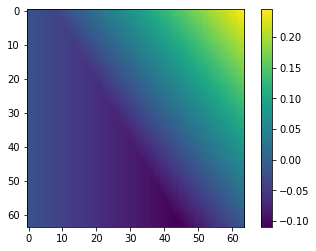

In [17]:
plt.imshow(depth_images_2d[1001])
plt.colorbar()

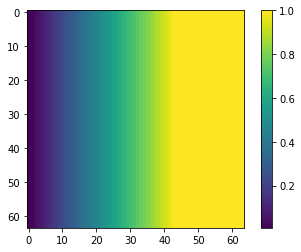

In [23]:
plt.imshow(labels_reg[non_flat_indices[105]].reshape(64, 64))
plt.colorbar()

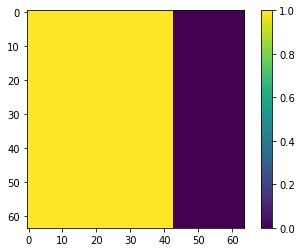

In [24]:
plt.imshow(labels_seg[non_flat_indices[105]])
plt.colorbar()

In [14]:
preds = np.load('/gpfs/gpfs0/g.bobrovskih/two-heads//predictions_two-heads_vgg13_bn_two-heads.npy')

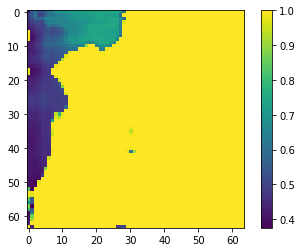

In [25]:
# norm_dist = mpl.colors.Normalize(vmin=0, vmax=1)
# cmap_dist = plt.get_cmap('coolwarm_r')
# m_dist = cm.ScalarMappable(norm=norm_dist, cmap=cmap_dist)
plt.imshow(torch.FloatTensor(preds[non_flat_indices[105]][0]))#, cmap=cmap_dist, vmin=0.0, vmax=1.0)
plt.colorbar()

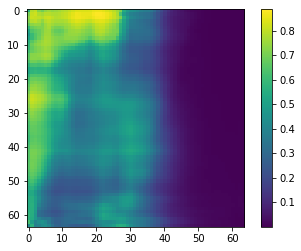

In [28]:
plt.imshow(torch.nn.Sigmoid()(torch.FloatTensor(preds[non_flat_indices[105]][1])))#, cmap=cmap_dist, vmin=0.0, vmax=1.0)
plt.colorbar()

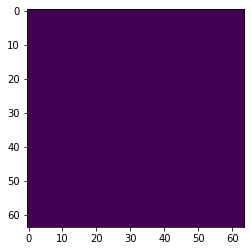

In [29]:
plt.imshow(preds[non_flat_indices[1]][0] > 0.5)

In [8]:
non_flat_indices = np.where(labels.sum(-1).sum(-1) < 4096)[0]
flat_indices = np.where(labels.sum(-1).sum(-1) >= 4096)[0]

In [ ]:
# 778, 4008, 4014, 2015, 0, 1, 20, 335, 3351, 3358, 4773, 4774, 1007, 4211, 1601, 4214

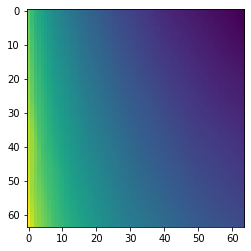

In [171]:
plt.imshow(depth_images_2d[flat_indices[4214]])

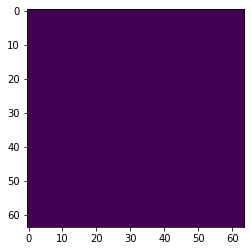

In [122]:
plt.imshow(labels_reg[flat_indices[3358]].reshape(64, 64))

In [172]:
preds = np.load('/gpfs/gpfs0/g.bobrovskih/mse_loss/vgg13/predictions_vgg13.npy')

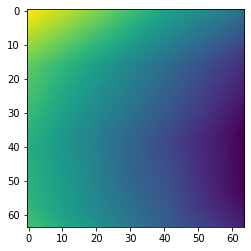

In [140]:
plt.imshow(depth_images_2d[flat_indices[3777]])

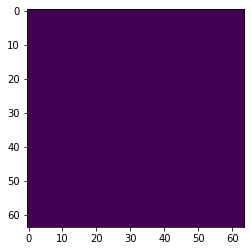

In [123]:
plt.imshow(labels[flat_indices[3937]][0].reshape(64, 64))

In [34]:
flat_indices

array([   0,    1,    2, ..., 8976, 8977, 8978])

In [ ]:
# 70, 300, 310, 311, 317, 333, 337, 1003, 1030, 1095, 4180, 4182, 4412, 5600, 5800
# 377, 6200, 6440, 5557, 5530, 5637, 997, 990, 995, 3777

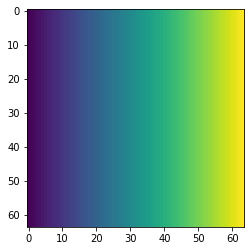

In [187]:
plt.imshow(depth_images_2d[flat_indices[5600]])

In [ ]:
plt.imshow(labels[flat_indices[310]][0].reshape(64, 64))

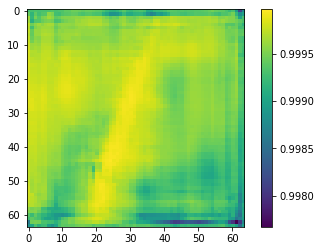

In [23]:
plt.imshow(preds[~non_flat_indices[0]])
plt.colorbar()

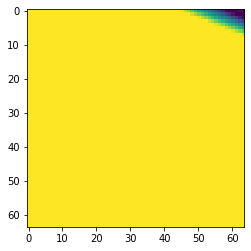

In [27]:
plt.imshow(labels[non_flat_indices][0][0].reshape(64, 64))

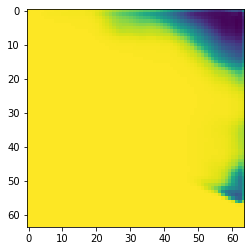

In [28]:
plt.imshow(preds[non_flat_indices][0][0])

In [31]:
sample = 1146

In [175]:
def get_colors(pred, cmap):
    import matplotlib as mpl
    import matplotlib.cm as cm
    hex_colors = []
    norm = mpl.colors.Normalize(vmin=-1, vmax=0)
    cmap = cmap
    m = cm.ScalarMappable(norm=norm, cmap=cmap)
    if len(pred.shape) > 2:
        iterator = pred.reshape(-1)
    else:
        iterator = pred
    for i in iterator:
#         hex_colors.append(m.to_rgba(i))
        hex_colors.append(int(mpl.colors.to_hex(m.to_rgba(i)).replace('#','0x'),16))
    hex_colors = np.array(hex_colors, 'uint32')

    return(hex_colors)

In [176]:
def illustrate_3d(sample, depth_images, labels, preds, name='cnn_based'):
    import k3d
    import matplotlib as mpl
    import matplotlib.cm as cm

    data = depth_images[sample].copy()
    data_shift = depth_images[sample].copy()
    data_shift[:,0] = data_shift[:,0]+2.1

    pred = preds[sample]
    lab = labels[sample]

    p = k3d.plot()

    ori_1 = [0,1,1]
    ori_2 = [2.1,1,1]
    v_p = [0,0,0]
    v_t = [0,0,0]

    col_tr = get_colors(-torch.from_numpy(lab.reshape(-1)), cm.coolwarm)
    col_pr = get_colors(-torch.from_numpy(pred.reshape(-1)), cm.coolwarm)


    points_1 = k3d.points(data, col_pr, point_size=0.025, shader='mesh', )
    points_2 = k3d.points(data_shift, col_tr, point_size=0.025, shader='mesh', )
    vects_p = k3d.vectors(ori_1, v_p, use_head=False, labels=['pred'])
    vects_t = k3d.vectors(ori_2, v_t, use_head=False, labels=['true'])

    p += points_1+points_2+vects_p+vects_t

    f = open('./{}.html'.format(name), 'w')
    f.write(p.get_snapshot())
    f.close()

In [34]:
labels.shape

(8980, 1, 4096)

In [35]:
name = 'prediction_'+str(sample)
illustrate_3d(sample, depth_images_3d[non_flat_indices], labels[non_flat_indices], preds[non_flat_indices], name)

In [88]:
sample = 1454
name = 'prediction_'+str(sample)
illustrate_3d(sample, depth_images[non_flat_indices], labels[non_flat_indices], preds[non_flat_indices], name)

In [89]:
sample = 2145
name = 'prediction_'+str(sample)
illustrate_3d(sample, depth_images[non_flat_indices], labels[non_flat_indices], preds[non_flat_indices], name)

In [90]:
sample = 116
name = 'prediction_'+str(sample)
illustrate_3d(sample, depth_images[non_flat_indices], labels[non_flat_indices], preds[non_flat_indices], name)

In [91]:
sample = 1911
name = 'prediction_'+str(sample)
illustrate_3d(sample, depth_images[non_flat_indices], labels[non_flat_indices], preds[non_flat_indices], name)

## get best/worse images indexes

In [16]:
# labels_non_flat = np.array(distances)[non_flat_indices]
# depths_non_flat = np.array(depths_normalized)[non_flat_indices]

In [17]:
val_loss_values= np.array(torch.load('/gpfs/gpfs0/g.bobrovskih/mse_loss//vgg13/val_loss_values_reg_unet_vgg13_bn_epoch499'))


In [18]:
val_loss_values = val_loss_values[non_flat_indices]

In [19]:
min_loss_imgs = np.argsort(val_loss_values)[:10]
max_loss_imgs = np.argsort(val_loss_values)[len(val_loss_values) - 15:]

In [20]:
val_loss_values[max_loss_imgs]

array([0.4978635 , 0.50470304, 0.5065589 , 0.5172108 , 0.54815507,
       0.5865792 , 0.5979823 , 0.60065997, 0.60574186, 0.6071077 ,
       0.60916173, 0.61665046, 0.6175508 , 0.6352515 , 0.6481534 ],
      dtype=float32)

In [21]:
max_loss_imgs

array([1607, 1454,  238,  116, 1911,  258, 1704,  683,  340,  308, 1268,
        144, 2145, 1746, 1975])

In [22]:
min_loss_imgs

array([1215, 1679, 1045,  186, 2255,   56,  679,  630, 1743, 1146])

In [23]:
# vgg13 and vgg16 shares 1607, 1454, 2145, 116, 1911, 258, 308, 

In [23]:
depths_non_flat = depth_images_2d[non_flat_indices]
labels_non_flat = labels[non_flat_indices]
preds_non_flat = preds[non_flat_indices]
min_depths = []
min_tg = []
min_pred = []
for i in min_loss_imgs:
    min_depths.append(depths_non_flat[i])
    min_tg.append(labels_non_flat[i][0].reshape(64, 64))
    min_pred.append(preds_non_flat[i])
    
max_depths = []
max_tg = []
max_pred = []
for i in max_loss_imgs:
    max_depths.append(depths_non_flat[i])
    max_tg.append(labels_non_flat[i][0].reshape(64, 64))
    max_pred.append(preds_non_flat[i])

In [174]:
def illustrate_results_2d_3d(
                                 depths,
                                 distances,
                                 preds,
                                 ids,
                                 name='unet',
                                 dirry='./',
                                 save_3d=False,
                                 depths_3d=None):
    import k3d
    import matplotlib as mpl
    import matplotlib.cm as cm
    import matplotlib.ticker as ticker
    from mpl_toolkits.axes_grid1 import AxesGrid
    
    size = len(ids)

    fig = plt.figure(figsize=(30, 80), dpi=220)
    grid = AxesGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(size-1, 4),  # creates 2x2 grid of axes
                 axes_pad=0.7,  # pad between axes in inch.
                 label_mode="1",
                 share_all=True,
                 cbar_location="right",
                 cbar_mode="each",
                 cbar_size="11%",
                 cbar_pad="7%",
                 )
    #fig.text(0.5, 1.01, 'GOLDEN SET RESULTS {}'.format(model_name), ha='center', rotation='horizontal', fontsize=25)
    
    norm_dist = mpl.colors.Normalize(vmin=0, vmax=1)
    cmap_dist = plt.get_cmap('coolwarm_r')
    m_dist = cm.ScalarMappable(norm=norm_dist, cmap=cmap_dist)
    
    i = 0
    pic_id = 0
    count = 0
    for ax, cax in zip(grid, grid.cbar_axes):
    # Iterating over the grid returns the Axes.
        if i == 0:
            # plot depth
            ax_depth = ax.imshow(depths[ids[pic_id]])
            cbar = fig.colorbar(ax_depth, cax=cax)
            cbar.set_ticks((depth.min(), depth.max()))
            cbar.ax.tick_params(labelsize=8)
            cbar.locator = ticker.MaxNLocator(6)
            cbar.update_ticks()
            ax.set_title('Depth {}'.format(ids[pic_id]), fontsize=10)
            
        if i == 1:
            tg = distances[ids[pic_id]]
            # plot distance
            ax_dist = ax.imshow(convert_dist(tg, m_dist), cmap=cmap_dist, vmin=0.0, vmax=1.0)
            cbar = fig.colorbar(ax_dist, cax=cax, norm=norm_dist)
            cbar.ax.tick_params(labelsize=8)
            cbar.locator = ticker.MaxNLocator(5)
            cbar.update_ticks()
            ax.set_title('GT Distance Field {}'.format(ids[pic_id]), fontsize=10)
            
        if i == 2:
            prediction = preds[ids[pic_id]]
            # plot prediction
            ax_pred = ax.imshow(convert_dist(prediction, m_dist), cmap=cmap_dist, vmin=0.0, vmax=1.0)
            cbar = fig.colorbar(ax_pred, cax=cax, norm=norm_dist)
            cbar.ax.tick_params(labelsize=8)
            cbar.locator = ticker.MaxNLocator(5)
            cbar.update_ticks()
            ax.set_title('Prediction Distance Field {}'.format(ids[pic_id]), fontsize=10)
            
        if i == 3:
            # get metric
            metric = metric_per_pix(tg, prediction, 2) # prediction was computed at step i=2,
                                                       # target was computed at step i=1;
            # plot metric 
            norm_metric = mpl.colors.Normalize(vmin=0, vmax=metric.max())
            cmap_metric = plt.get_cmap('viridis')
            m_metric = cm.ScalarMappable(norm=norm_metric, cmap=cmap_metric)
            ax_metric = ax.imshow(convert_dist(metric, m_metric), cmap=cmap_metric, vmin='0.0', vmax=metric.max())
            cbar = fig.colorbar(ax_metric, cax=cax, norm=norm_metric)
            cbar.ax.tick_params(labelsize=8)
            cbar.locator = ticker.MaxNLocator(6)
            cbar.update_ticks()
            ax.set_title('Metric per pix', fontsize=8.5)

        i += 1
        if i == 4:
            pic_id += 1
            i = 0 # change picture
        
        if save_3d:
            count += 1
            if depths_3d is not None:
                illustrate_3d(ids[pic_id], depths_3d, distances, preds, '{}/{}_{}'.format(dirry, name, ids[pic_id]))
            else:
                print('dephts 3d is not defined = no plot 3d')
    
    plt.savefig('{}/results_{}.png'.format(dirry, name))

In [28]:
illustrate_results_2d_3d(depths=depth_images_2d[non_flat_indices],
                         distances=labels[non_flat_indices].reshape(len(non_flat_indices), 64, 64), 
                         preds=preds[non_flat_indices],
                         ids=max_loss_imgs, 
                         name='max_loss_'+cfg['name'], 
                         dirry='./results/max_loss',
                         save_3d=True,
                         depths_3d=depth_images_3d[non_flat_indices])

./results/max_loss/max_loss_reg_unet_vgg13_bn_1607
./results/max_loss/max_loss_reg_unet_vgg13_bn_1607
./results/max_loss/max_loss_reg_unet_vgg13_bn_1607
./results/max_loss/max_loss_reg_unet_vgg13_bn_1454
./results/max_loss/max_loss_reg_unet_vgg13_bn_1454
./results/max_loss/max_loss_reg_unet_vgg13_bn_1454
./results/max_loss/max_loss_reg_unet_vgg13_bn_1454
./results/max_loss/max_loss_reg_unet_vgg13_bn_238
./results/max_loss/max_loss_reg_unet_vgg13_bn_238
./results/max_loss/max_loss_reg_unet_vgg13_bn_238
./results/max_loss/max_loss_reg_unet_vgg13_bn_238
./results/max_loss/max_loss_reg_unet_vgg13_bn_116
./results/max_loss/max_loss_reg_unet_vgg13_bn_116
./results/max_loss/max_loss_reg_unet_vgg13_bn_116
./results/max_loss/max_loss_reg_unet_vgg13_bn_116
./results/max_loss/max_loss_reg_unet_vgg13_bn_1911
./results/max_loss/max_loss_reg_unet_vgg13_bn_1911
./results/max_loss/max_loss_reg_unet_vgg13_bn_1911
./results/max_loss/max_loss_reg_unet_vgg13_bn_1911
./results/max_loss/max_loss_reg_unet_vg

In [30]:
illustrate_results_2d_3d(depths=depth_images_2d[non_flat_indices],
                         distances=labels[non_flat_indices].reshape(len(non_flat_indices), 64, 64), 
                         preds=preds[non_flat_indices],
                         ids=min_loss_imgs, 
                         name='min_loss_'+cfg['name'], 
                         dirry='./results/min_loss',
                         save_3d=True,
                         depths_3d=depth_images_3d[non_flat_indices])

In [20]:
golden_set_ids = [ 890, 1169, 1173, 1256, 1395, 1424, 1600, 1895, 2190, 2255, 2475, 3278, 3549, 3744, 3746, 4416, 5158, 5518, 5648, 5772, 6050, 6177, 6541, 6990, 7341, 7633, 7696, 7918, 8132, 8921]


TraitError: colors has wrong size: 8192 (4096 required)

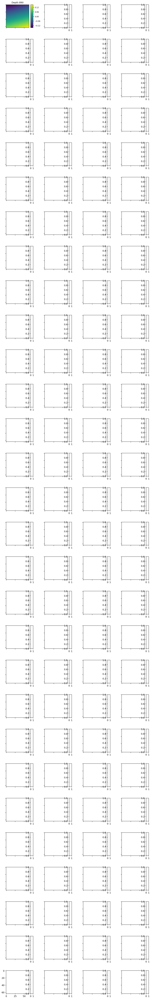

In [21]:
illustrate_results_2d_3d(depths=depth_images_2d,
                         distances=labels.reshape(len(labels), 64, 64), 
                         preds=preds,
                         ids=golden_set_ids, 
                         name='kldiv_golden_set'+cfg['name'], 
                         dirry='./results/kldiv_golden_set',
                         save_3d=True,
                         depths_3d=depth_images_3d)

In [141]:
flat_objects = [70, 300, 310, 311, 317, 333, 337, 1003, 1030, 1095, 4180, 4182, 4412, 5600, 5800]
flat_objects = [377, 6200, 6440, 5557, 5530, 5637, 997, 990, 995, 3777]

In [178]:
train_ids = [778, 4008, 4014, 2015, 0, 1, 20, 335, 3351, 3358, 4773, 4774, 1007, 4211, 1601, 4214]

illustrate_results_2d_3d(depths=depth_images_2d[flat_indices],
                         distances=labels_reg[flat_indices].reshape(len(labels[flat_indices]), 64, 64), 
                         preds=preds[flat_indices],
                         ids=train_ids, 
                         name='train'+cfg['name'], 
                         dirry='./results/train',
                         save_3d=True,
                         depths_3d=depth_images_3d[flat_indices])

In [13]:
preds_two_head = np.load('/gpfs/gpfs0/g.bobrovskih/two-heads/predictions_two-heads_vgg16_bn_segmentation.npy')

In [21]:
preds_two_head.shape

(8980, 2, 64, 64)

/gpfs/data/opt/python-3.7.1/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  


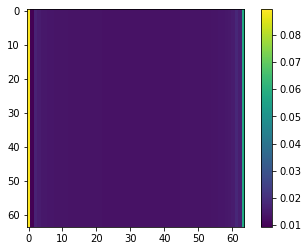

In [18]:
import torch.nn as nn
plt.imshow(nn.Softmax()(torch.FloatTensor(preds_two_head[1][0])))
plt.colorbar()

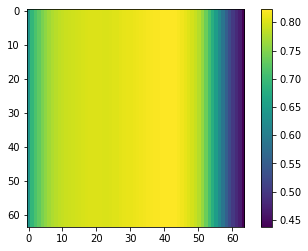

In [23]:
plt.imshow(preds_two_head[non_flat_indices[1]][0])
plt.colorbar()

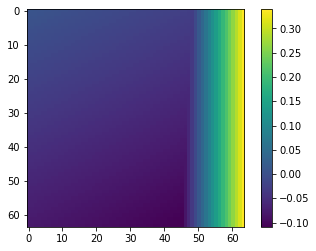

In [24]:
plt.imshow(depth_images_2d[non_flat_indices[1]])
plt.colorbar()

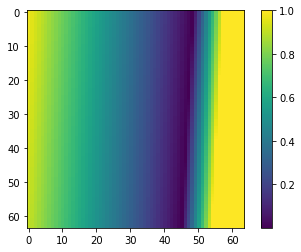

In [205]:
plt.imshow(labels[non_flat_indices[1]][0].reshape(64, 64))
plt.colorbar()

In [ ]:
data_label = 'image'
target_label = 'distances'
transforms = None
dataset = DepthHDF5Dataset('two-heads', '/gpfs/gpfs0/3ddl/sharp_features/eccv_data/images/dataset_config_high_res_clean.json_64x64/train/batched_16k', partition=None, normalisation=['quantile_normalize', 'standartize'],
                 transform=transforms, target_transform=None, max_loaded_files=1, quality='high')

val_dataset = DepthHDF5Dataset(
                                   cfg['task'],
                                   '/gpfs/gpfs0/3ddl/sharp_features/eccv_data/images/dataset_config_high_res_clean.json_64x64/',
                                   partition='val/batched_16k',
                                   normalisation=cfg['normalisation'],
                                   transform=transforms,
                                   save_mask=False,
                                   target_transform=None,
                                   max_loaded_files=12
                                  )

val_loader = DataLoader(val_dataset, batch_size=1)



two-heads
preload 0
in progress filename /gpfs/data/gpfs0/3ddl/sharp_features/eccv_data/images/dataset_config_high_res_clean.json_64x64/train/batched_16k/train_3.hdf5


In [25]:
depth, target_ = val_dataset[116][0], val_dataset[116][1]
print(target_.shape)

torch.Size([2, 64, 64])


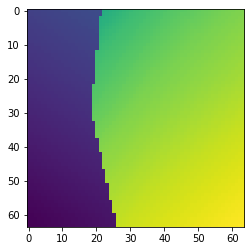

In [27]:
plt.imshow(depth[0])

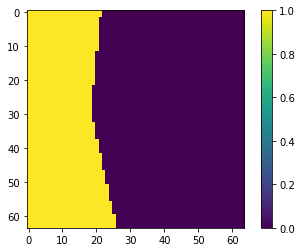

In [30]:
plt.imshow(target_[1])
plt.colorbar()

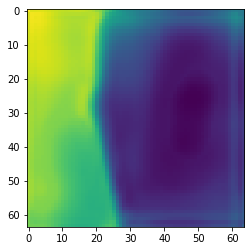

In [32]:
plt.imshow(preds_two_head[116][1])

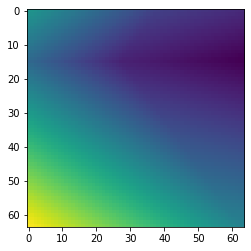

In [28]:
plt.imshow(max_depths[3])

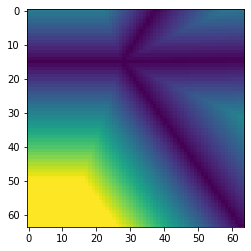

In [29]:
plt.imshow(max_tg[3])


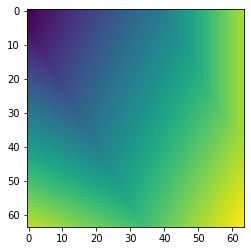

In [98]:
plt.imshow(depths_normalized[6822])

## draw images from golden set

In [17]:
max_to_min_id = np.argsort(num_surfaces)[::-1]

In [18]:
ids = [ 890, 1169, 1173, 1256, 1395, 1424, 1600, 1895, 2190, 2255, 2475, 3278, 3549, 3744, 3746, 4416, 5158, 5518, 5648, 5772, 6050, 6177, 6541, 6990, 7341, 7633, 7696, 7918, 8132, 8921]


In [25]:
epoch = 499
directory = 'mse_loss/vgg16'

In [26]:
def illustrate_goldenset_results(model, data, distances, ids, model_name):
    import matplotlib as mpl
    import matplotlib.cm as cm
    import matplotlib.ticker as ticker
    from mpl_toolkits.axes_grid1 import AxesGrid
    
    size = len(ids)

    fig = plt.figure(figsize=(30, 80), dpi=220)
    grid = AxesGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(30, 4),  # creates 2x2 grid of axes
                 axes_pad=0.7,  # pad between axes in inch.
                 label_mode="1",
                 share_all=True,
                 cbar_location="right",
                 cbar_mode="each",
                 cbar_size="11%",
                 cbar_pad="7%",
                 )
    #fig.text(0.5, 1.01, 'GOLDEN SET RESULTS {}'.format(model_name), ha='center', rotation='horizontal', fontsize=25)
    
    model.load_state_dict(torch.load('/gpfs/gpfs0/g.bobrovskih/{}/seg_model_{}_epoch_{}'.format(directory, cfg['name'], epoch)))
    model.eval();
    
    norm_dist = mpl.colors.Normalize(vmin=0, vmax=1)
    cmap_dist = plt.get_cmap('coolwarm_r')
    m_dist = cm.ScalarMappable(norm=norm_dist, cmap=cmap_dist)
    
    i = 0
    pic_id = 0
    for ax, cax in zip(grid, grid.cbar_axes):
    # Iterating over the grid returns the Axes.
        if i == 0:
            # plot depth
            depth = data[ids[pic_id]]
            ax_depth = ax.imshow(depth)
            cbar = fig.colorbar(ax_depth, cax=cax)
            cbar.set_ticks((depth.min(), depth.max()))
            cbar.ax.tick_params(labelsize=8)
            cbar.locator = ticker.MaxNLocator(6)
            cbar.update_ticks()
            ax.set_title('Depth', fontsize=8.5)
            
        if i == 1:
            # plot distance
            tg = distances[ids[pic_id]]
            ax_dist = ax.imshow(convert_dist(distances[ids[pic_id]], m_dist), cmap=cmap_dist, vmin=0.0, vmax=1.0)
            cbar = fig.colorbar(ax_dist, cax=cax, norm=norm_dist)
            #cbar.set_ticks((0.0, 1.0))
            cbar.ax.tick_params(labelsize=8)
            cbar.locator = ticker.MaxNLocator(5)
            cbar.update_ticks()
            ax.set_title('GT Distance Field', fontsize=8.5)
            
        if i == 2:
            # get prediction
            depth = standartize(quantile_normalize(data[ids[pic_id]]))
            depth_torch = torch.FloatTensor(depth).unsqueeze(0)
            depth_torch_cat = torch.cat([depth_torch, depth_torch, depth_torch], dim=0).unsqueeze(0)
            discretization = 240  # heuristic
            sigma = 1 / discretization
            #prediction = get_estimated_pred(model.forward(depth_torch_cat).detach(), torch.FloatTensor(tg), sigma, discretization)[0].cpu().numpy()
            prediction = model.forward(depth_torch_cat)[0][0].detach().cpu().numpy()
            # plot prediction
            ax_pred = ax.imshow(convert_dist(prediction, m_dist), cmap=cmap_dist, vmin=0.0, vmax=1.0)
            cbar = fig.colorbar(ax_pred, cax=cax, norm=norm_dist)
            cbar.ax.tick_params(labelsize=8)
            cbar.locator = ticker.MaxNLocator(5)
            cbar.update_ticks()
            ax.set_title('Prediction Distance Field', fontsize=8)
            
        if i == 3:
            # get metric
            metric = metric_per_pix(tg, prediction, 2) # prediction was computed at step i=2,
                                                       # target was computed at step i=1;
            # plot metric 
            norm_metric = mpl.colors.Normalize(vmin=0, vmax=metric.max())
            cmap_metric = plt.get_cmap('viridis')
            m_metric = cm.ScalarMappable(norm=norm_metric, cmap=cmap_metric)
            ax_metric = ax.imshow(convert_dist(metric, m_metric), cmap=cmap_metric, vmin='0.0', vmax=metric.max())
            cbar = fig.colorbar(ax_metric, cax=cax, norm=norm_metric)
            cbar.ax.tick_params(labelsize=8)
            cbar.locator = ticker.MaxNLocator(6)
            cbar.update_ticks()
            ax.set_title('Metric per pix', fontsize=8.5)

        i += 1
        if i == 4:
            pic_id += 1
            i = 0 # change picture
        
        #fig.set_size_inches([20, 5],forward=True)
        #fig.suptitle(name_plot, fontsize=14)
    
    plt.savefig('./golden_set_{}.png'.format(model_name))

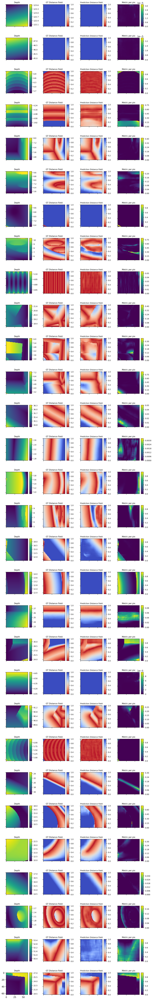

In [27]:
illustrate_goldenset_results(model, data, distances, ids, 'vgg16_bn_mse')

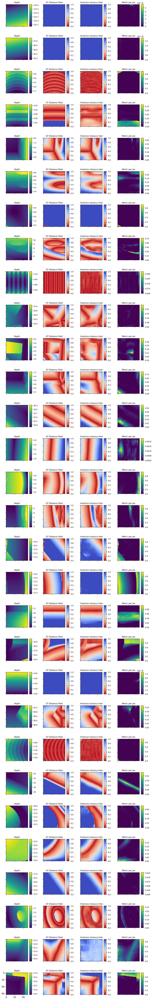

In [29]:
illustrate_goldenset_results(model, data, distances, ids, 'vgg16_bn')

## draw loss histograms

## all histograms

In [41]:
def table_hist(arr_of_hists, mse_average, names):
    size = len(arr_of_hists)
    fig, axs = plt.subplots(size, size, figsize=(40,40))
    fig.tight_layout(pad=3.0)
    fig.text(0.5, 1.01, 'VAL RMSE PER PIX RESULTS IMAGE BASED ENCODERS', ha='center', rotation='horizontal', fontsize=35)
    fig.text(0.0, 0.5, 'RMSE LOSS VALUE', ha='center', rotation='vertical', fontsize=35)
    fig.text(0.5, 0.0, '# OF SAMPLES', va='center', fontsize=35) 
    plt.xlim(0.0, 1.0)
    
    for i in range(size): # i-th versus all
        namei = names[i]
        for j in range(size): # j-th versus i-th
            namej = names[j]
            batch_size = arr_of_hists[i].shape[1]
            if i == j:
                axs[i, j].hist(torch.sqrt(arr_of_hists[i].reshape(arr_of_hists[i].shape[0]*batch_size, -1).mean(-1)), bins=100, alpha=0.5, label=namei)
                title = namei.split('_')[0] + ' avg_mse ' + str(round(mse_average[i], 5))
            else:
                title = namei.split('_')[0] + ' vs ' + namej.split('_')[0]
                axs[i, j].hist(torch.sqrt(arr_of_hists[i].reshape(arr_of_hists[i].shape[0]*batch_size, -1).mean(-1)), bins=100, alpha=0.5, label=namei)
                axs[i, j].hist(torch.sqrt(arr_of_hists[j].reshape(arr_of_hists[j].shape[0]*batch_size, -1).mean(-1)), bins=100, alpha=0.5, label=namej)
                
            axs[i, j].set_yscale('log')
            axs[i, j].legend(loc='upper right', fontsize=15)
            axs[i, j].set_title(title, fontsize=25)
    plt.savefig('./results_histograms.png')
            

In [3]:
directory = 'mse_loss'
arr_of_hists = []
names = ['vgg11_bn', 'vgg13_bn', 'vgg16_bn', 'vgg19_bn', 'resnet18', 'resnet34', 'resnet50']
num_epochs = ['500', '480', '500', '600', '500', '500', '600']
for i, name in enumerate(names):
    arr_of_hists.append(torch.load('/gpfs/gpfs0/g.bobrovskih/{}/{}/val_log_l2error_reg_unet_{}_epoch{}'.format(directory, name.split('_')[0], name, num_epochs[i])).squeeze(2))
    
mse_average = []
key = 'mse loss'
for i, name in enumerate(names):
    mse_average.append(json.load(open('/gpfs/gpfs0/g.bobrovskih/{}/{}/val_reg_unet_{}_log_epoch_{}.json'.format(directory, name.split('_')[0], name, num_epochs[i])))[key])
 


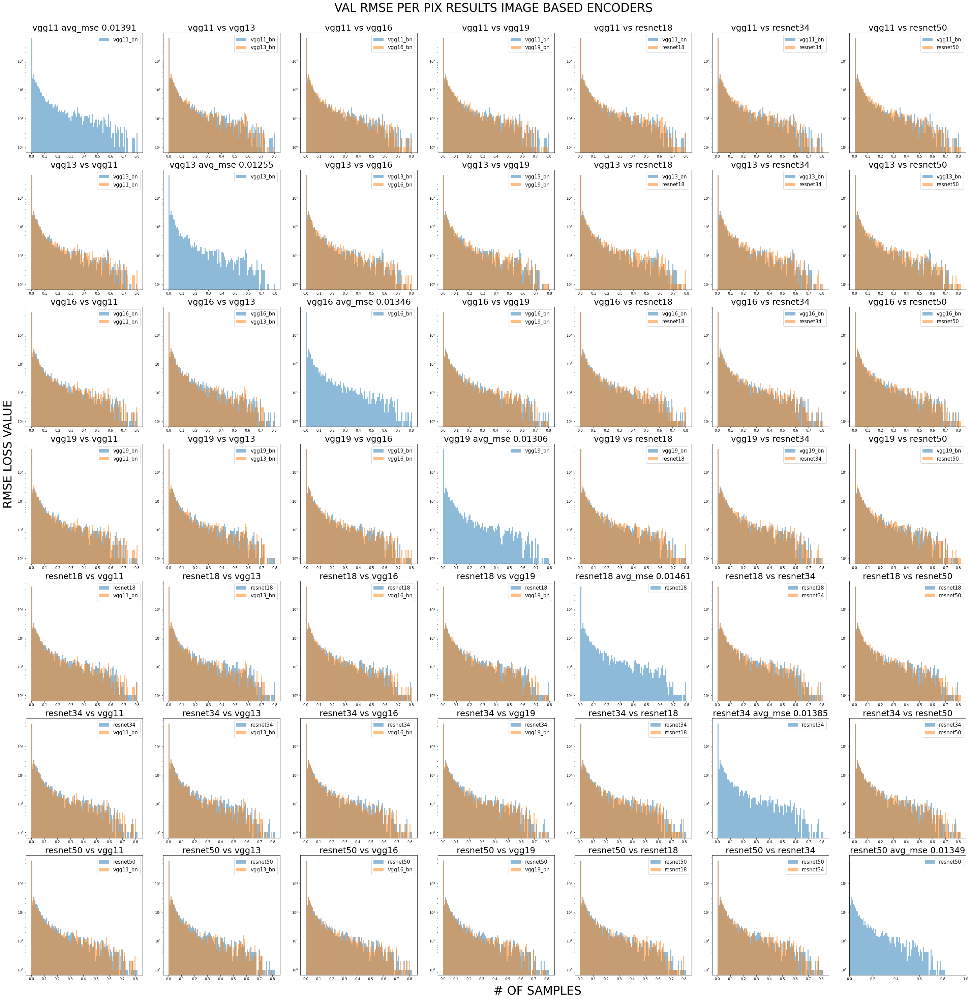

In [42]:
table_hist(arr_of_hists, mse_average, names)

## single comparison

In [5]:
val_l2error_1 = torch.load('/gpfs/gpfs0/g.bobrovskih/mse_loss/vgg13//val_log_l2error_reg_unet_vgg13_bn_epoch500').squeeze(2)
val_l2error_2 = torch.load('/gpfs/gpfs0/g.bobrovskih/kldiv/vgg16/val_log_l2error_reg_unet_vgg16_bn_epoch450').squeeze(2)


In [6]:
val_l2error_1.shape

torch.Size([8979, 1, 64, 64])

In [9]:
batch_size = val_l2error_1.shape[1]
torch.sqrt(val_l2error_1.reshape(val_l2error_1.shape[0]*batch_size, -1).mean(-1)).shape

torch.Size([8979])

In [11]:
torch.sqrt(val_l2error_2.reshape(val_l2error_2.shape[0]*batch_size, -1).mean(-1)).mean()

tensor(0.0363)

In [ ]:
torch.sqrt(val_l2error_1.reshape(val_l2error_1.shape[0]*batch_size, -1).mean(-1)).mean()

(0.0, 1.0)

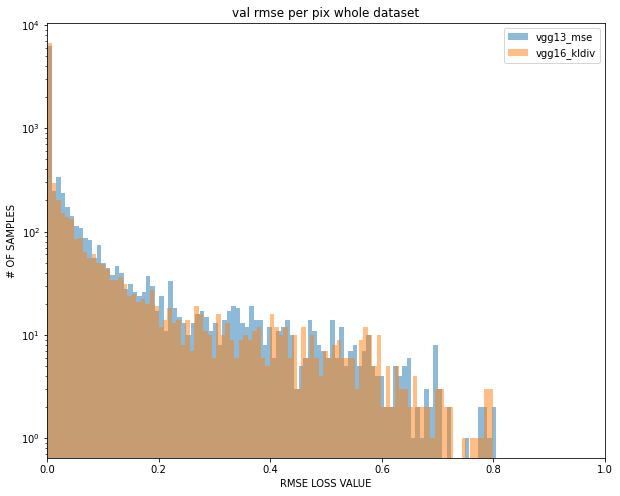

In [33]:
plt.figure(figsize=(10, 8))
name1 = 'vgg13_mse'
name2 = 'vgg16_kldiv'
batch_size = val_l2error_1.shape[1]
plt.hist(torch.sqrt(val_l2error_1.reshape(val_l2error_1.shape[0]*batch_size, -1).mean(-1)), bins=100, alpha=0.5, label=name1)
plt.hist(torch.sqrt(val_l2error_2.reshape(val_l2error_2.shape[0]*batch_size, -1).mean(-1)), bins=100, alpha=0.5, label=name2)
plt.yscale('log')
plt.title('val rmse per pix whole dataset')
plt.legend(loc='upper right')
plt.xlabel('RMSE LOSS VALUE')
plt.ylabel('# OF SAMPLES')
plt.xlim(0.0, 1.0)

In [14]:
train_l2error_vgg19 = torch.load('/gpfs/gpfs0/g.bobrovskih/mse_loss/vgg19/train_log_l2error_reg_unet_vgg19_bn_epoch500')
train_l2error_vgg16 = torch.load('/gpfs/gpfs0/g.bobrovskih/mse_loss/vgg16/train_log_l2error_reg_unet_vgg16_bn_epoch500')


In [15]:
train_errors_vgg16 = train_l2error_vgg16.squeeze(2)
train_errors_vgg19 = train_l2error_vgg19.squeeze(2)


64


(0.0, 1.0)

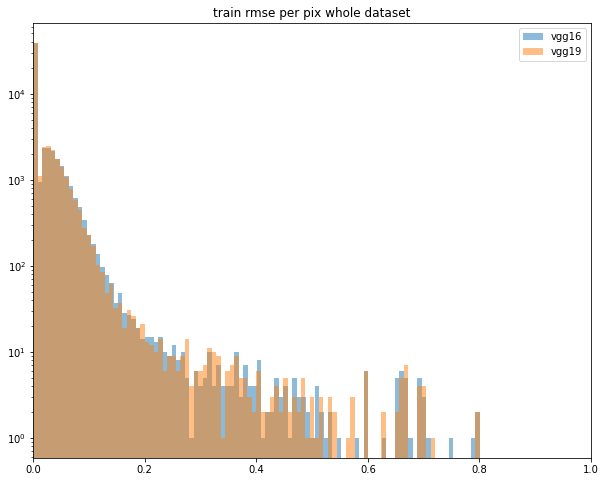

In [16]:
plt.figure(figsize=(10, 8))
batch_size = train_errors_vgg16.shape[1]
print(batch_size)
plt.hist(torch.sqrt(train_errors_vgg16.reshape(train_errors_vgg16.shape[0]*batch_size, -1).mean(-1)), bins=100, alpha=0.5, label='vgg16')
plt.hist(torch.sqrt(train_errors_vgg19.reshape(train_errors_vgg19.shape[0]*batch_size, -1).mean(-1)), bins=100, alpha=0.5, label='vgg19')
plt.yscale('log')
plt.title('train rmse per pix whole dataset')
plt.legend(loc='upper right')
plt.xlim(0.0, 1.0)

In [4]:
model_parameters = filter(lambda p: p.requires_grad, model.parameters())
params = sum([np.prod(p.size()) for p in model_parameters])

In [5]:
params

14328081

## gridsearch check

In [11]:
import json 
import os

In [48]:
losses = []
directory = 'mse_loss/resnet18'
name = 'val_reg_unet_resnet18_log_epoch'
key = 'mse loss'
i = 0
for i in range(10, 680, 1):
    losses.append(json.load(open('/gpfs/gpfs0/g.bobrovskih/{}/{}_{}.json'.format(directory, name, str(i))))[key])

In [49]:
len(losses)

670

In [50]:
np.argsort(losses)[:5]

array([540, 393, 242, 579, 603])

Text(0.5, 0, 'overfit epoch')

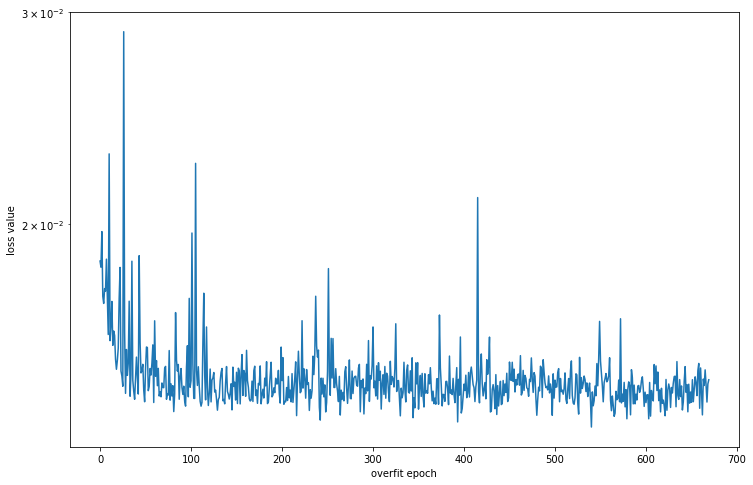

In [51]:
plt.figure(figsize=(12,8))
plt.plot(losses)
plt.yscale('log')
plt.ylabel('loss value')
plt.xlabel('overfit epoch')

In [11]:
losses_gridsearch = []
i = 0
for name in os.listdir('/gpfs/gpfs0/g.bobrovskih/overfit-gridsearch'):
    if 'json' in name and '3000' in name:
        losses_gridsearch.append(json.load(open('/gpfs/gpfs0/g.bobrovskih/overfit-gridsearch/{}'.format(name)))['another_loss'])
        print(name, losses_gridsearch[-1], i)
        i += 1

1.3000000000000003_train_log_epoch_1000.json 0.08782435655593872 0
1.5000000000000002_train_log_epoch_3000.json 0.22444608211517333 1
1.0_train_log_epoch_3000.json 0.16309012472629547 2
1.6_train_log_epoch_3000.json 0.12086848467588425 3
1.4000000000000001_train_log_epoch_3000.json 0.21293361783027648 4
1.7000000000000002_train_log_epoch_3000.json 0.1326957494020462 5
0.9_train_log_epoch_3000.json 0.1498619258403778 6
1.8000000000000003_train_log_epoch_3000.json 0.14467729330062867 7
1.1_train_log_epoch_3000.json 0.17552365958690644 8
0.1_train_log_epoch_3000.json 0.02232215292751789 9
0.30000000000000004_train_log_epoch_3000.json 0.06130865141749382 10
0.2_train_log_epoch_3000.json 0.04300621151924133 11
0.5_train_log_epoch_3000.json 0.09422935545444489 12
0.7000000000000001_train_log_epoch_3000.json 0.12249863743782044 13
1.9000000000000001_train_log_epoch_3000.json 0.15832552909851075 14
1.3000000000000003_train_log_epoch_3000.json 0.20051429271697999 15
0.30000000000000004_train_lo

In [51]:
logs = []
for i in range(10, 500):
    json.load(open('/gpfs/gpfs0/g.bobrovskih/kldiv/no_filter//train_log_epoch_20.json'))['kldiv loss']
    logs.append(json.load(open('/gpfs/gpfs0/g.bobrovskih/kldiv/no_filter//val_log_epoch_{}.json'.format(i)))['kldiv loss'])
    

## kldiv loss functions

In [13]:
from torch import erf
def calculate_density(mean, sigma, discretization, a=0, b=1, margin=2):
    # compute how many bins should be (heuristic)
    #             sigma = 1 / discretization

    # allow margins from interval ranges for better accuracy
    a = a - margin * (1 / discretization)
    b = b + margin * (1 / discretization)

    num_bins = discretization + margin * 2

    # calculate bin limits
    tmp_bins = np.tile(np.linspace(a, b, num_bins + 1), (mean.shape[0], mean.shape[1], 1))
    bin_limits = torch.FloatTensor(tmp_bins).to('cuda')

    # normalizing coefficient
    Z = 0.5 * (erf((b - mean) / (np.sqrt(2) * sigma)) - erf((a - mean) / (np.sqrt(2) * sigma)))

    # compute discretized densities
    # c = torch.zeros((mean.shape[0], mean.shape[1], 240))

    # for i, bin in enumerate(bin_limits):
    tmp = erf((bin_limits[:, :, 1:] - mean.unsqueeze(-1)) / (np.sqrt(2) * sigma)) - erf(
        (bin_limits[:, :, :-1] - mean.unsqueeze(-1)) / (np.sqrt(2) * sigma))
    c = tmp / 2 / Z.unsqueeze(-1)

    # return the computed density and set of centers of the bins
    return c.permute(1, 0, 2, ).type(torch.float32), (bin_limits[:, :, :-1] + (1 / discretization / 2)).type(
        torch.float32), num_bins

def get_estimated_pred(prediction, tg, sigma, discretization):
    batch_sz = prediction.shape[0]
    density, linspace, num_bins = calculate_density(tg.reshape(batch_sz, -1).T.to('cuda'), sigma, discretization)
    
    estimated_pred = torch.matmul(
            torch.exp(prediction.reshape(1, num_bins, -1).permute(0, 2, 1)[:, :, None, :].detach().cpu()),
            linspace.detach().cpu().permute(1, 0, 2)[:, :, :, None])
    estimated_pred = estimated_pred.reshape(1, 64, 64)
    
    return estimated_pred

In [14]:
discretization = 240  # heuristic
sigma = 1 / discretization
    
def get_predictions_from_batch(batch, return_input=True):
    depth = batch[0][0][0]
    tg = batch[1][0]

    batch_sz = tg.shape[0]
    density, linspace, num_bins = calculate_density(tg.reshape(batch_sz, -1).T.to('cuda'), sigma, discretization)
    
    prediction = model.forward(batch[0])
    estimated_pred = prediction[0]
    
    estimated_pred = torch.matmul(
            torch.exp(prediction.reshape(1, num_bins, -1).permute(0, 2, 1)[:, :, None, :].detach().cpu()),
            linspace.detach().cpu().permute(1, 0, 2)[:, :, :, None])
    estimated_pred = estimated_pred.reshape(1, 64, 64)

    if return_input:
        return depth, tg[0], estimated_pred[0].detach()
    else:
        return estimated_pred[0].detach()
    

## load model and illustrate results

In [109]:
epoch = 499
directory = 'mse_loss/vgg13'
model.load_state_dict(torch.load('/gpfs/gpfs0/g.bobrovskih/{}/seg_model_{}_epoch_{}'.format(directory, cfg['name'], epoch)))
model.eval();


In [115]:
depth, tg = batch

if 'kldiv' in directory:
    prediction = get_estimated_pred(model.forward(depth).detach(), tg)[0]
else:
    prediction = model.forward(depth)[0][0].detach()

In [116]:
prediction

tensor([[0.6328, 0.6230, 0.6195,  ..., 0.9982, 0.9976, 0.9966],
        [0.6365, 0.6223, 0.6084,  ..., 0.9983, 0.9979, 0.9975],
        [0.6477, 0.6308, 0.6149,  ..., 0.9988, 0.9979, 0.9978],
        ...,
        [0.1246, 0.1094, 0.1115,  ..., 0.4978, 0.5416, 0.5571],
        [0.1689, 0.1673, 0.1763,  ..., 0.4591, 0.5043, 0.5249],
        [0.1969, 0.1876, 0.2019,  ..., 0.4628, 0.4912, 0.5130]])

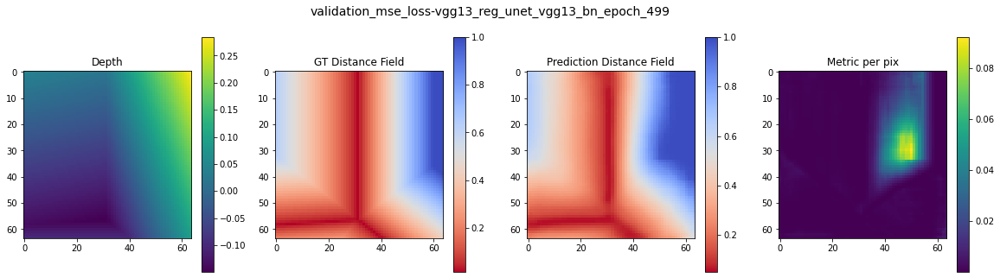

In [117]:
metric = metric_per_pix(tg[0][0].cpu().numpy(), prediction.cpu().numpy(), 2)
illustrate_results(depth[0][0], tg[0][0].cpu().numpy(), (prediction).cpu().numpy(), metric, name_plot='validation_{}_{}_epoch_{}'.format(directory.replace('/', '-'), cfg['name'], epoch))



In [13]:
metric.max()

0.014939617

In [18]:
tg = batch[1][0]
batch_sz = tg.shape[0]
density, linspace, num_bins = calculate_density(tg.reshape(batch_sz, -1).T.to('cuda'), sigma, discretization)
prediction = model.forward(batch[0])
print(prediction.shape)
kldiv = torch.nn.KLDivLoss(reduction='sum').forward(prediction.permute(0, 2, 3, 1).reshape(batch_sz, 4096, num_bins).to('cuda'), density.to('cuda'))

print(kldiv)


NameError: name 'calculate_density' is not defined

## best images

In [107]:
len(max_depths)

15

torch.Size([64, 64])


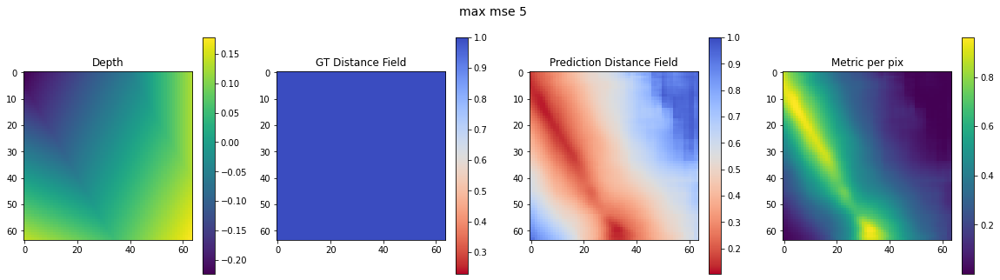

In [124]:
i = 5
max_tg_tmp = torch.FloatTensor(max_tg[i])
#max_depth_tmp = torch.FloatTensor(standartize(quantile_normalize(max_depths[i]))).unsqueeze(0)
max_depth_tmp = torch.FloatTensor(max_depths[i]).unsqueeze(0)
max_depth_tmp = torch.cat([max_depth_tmp, max_depth_tmp, max_depth_tmp], dim=0).unsqueeze(0)
if 'kldiv' in directory:
    discretization = 240  # heuristic
    sigma = 1 / discretization
    prediction = get_estimated_pred(model.forward(max_depth_tmp).detach(), tg, sigma, discretization)[0]
else:
    prediction = model.forward(max_depth_tmp)[0][0].detach()#get_predictions(min_depth_tmp.unsqueeze(0), min_tg_tmp.unsqueeze(0))
print(prediction.shape)
metric = metric_per_pix(max_tg_tmp.cpu().numpy(), prediction.cpu().numpy(), 2)
illustrate_results(max_depth_tmp[0][0], max_tg_tmp.cpu().numpy(), (prediction).cpu().numpy(), metric, name_plot='max mse {}'.format(i))


In [28]:
model.forward(max_depth_tmp).shape

torch.Size([1, 1, 64, 64])

In [29]:
max_tg_tmp.shape

torch.Size([64, 64])

In [36]:
from torch.nn import functional as F
import torch
torch.mean(F.mse_loss(model.forward(max_depth_tmp), max_tg_tmp.unsqueeze(0).unsqueeze(0), reduction='none'))

tensor(0.4977, grad_fn=<MeanBackward0>)

In [119]:
prediction

tensor([[0.9987, 0.9991, 0.9991,  ..., 0.9979, 0.9968, 0.9981],
        [0.9990, 0.9982, 0.9992,  ..., 0.9986, 0.9982, 0.9980],
        [0.9990, 0.9987, 0.9993,  ..., 0.9990, 0.9988, 0.9982],
        ...,
        [0.9975, 0.9969, 0.9971,  ..., 0.9991, 0.9991, 0.9979],
        [0.9965, 0.9980, 0.9974,  ..., 0.9989, 0.9976, 0.9968],
        [0.9979, 0.9984, 0.9986,  ..., 0.9989, 0.9969, 0.9983]])

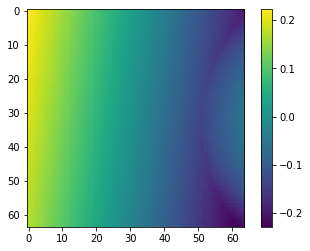

In [69]:
plt.imshow(standartize(quantile_normalize(min_depths[1])))
plt.colorbar()

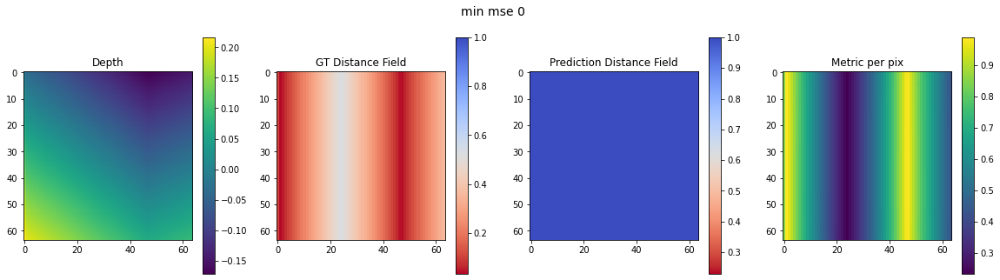

In [50]:
i = 0
min_tg_tmp = torch.FloatTensor(min_tg[i])
min_depth_tmp = torch.FloatTensor(standartize(quantile_normalize(max_depths[i]))).unsqueeze(0)
min_depth_tmp = torch.cat([min_depth_tmp, min_depth_tmp, min_depth_tmp], dim=0).unsqueeze(0)
prediction = model.forward(min_depth_tmp)[0][0].detach()#get_predictions(min_depth_tmp.unsqueeze(0), min_tg_tmp.unsqueeze(0))
metric = metric_per_pix(min_tg_tmp.cpu().numpy(), prediction.cpu().numpy(), 2)
illustrate_results(min_depth_tmp[0][0], min_tg_tmp.cpu().numpy(), (prediction).cpu().numpy(), metric, name_plot='min mse {}'.format(i))


In [27]:
min_tg_tmp[0].shape

torch.Size([64])

In [28]:
from torch.nn import functional as F
class lp_error():
    __name__ = 'rmse'
    def __init__(self, p=1):
        self.p = p

    def forward(self, pred, true):
        metric = (true - pred)**self.p
        return metric

class mse_loss(torch.nn.MSELoss):
    __name__ = 'mse loss'

    def forward(self, input, target, mask=None):
        if mask is None:
            return torch.mean(F.mse_loss(input, target, reduction='none')), \
                   lp_error(p=2).forward(input.detach().cpu(), target.detach().cpu()).numpy()
        else:
            # mask[mask == 1.0] = 5.0
            # mask[mask == 0.0] = 10.0
            return torch.mean(F.mse_loss(input, target, reduction='none') * mask)

In [31]:
prediction.shape

torch.Size([64, 64])

In [32]:
mse_loss().forward(prediction.unsqueeze(0), min_tg_tmp.unsqueeze(0))

(tensor(0.6166), array([[[0.22568205, 0.24589722, 0.268306  , ..., 0.4036802 ,
          0.3727076 , 0.34904525],
         [0.22601086, 0.24181525, 0.26689497, ..., 0.4060783 ,
          0.36968854, 0.3552612 ],
         [0.22311176, 0.24049182, 0.26554984, ..., 0.41030264,
          0.3745037 , 0.35693285],
         ...,
         [0.15982656, 0.173129  , 0.1960802 , ..., 0.4155218 ,
          0.38926944, 0.36479264],
         [0.12104315, 0.13956428, 0.1404678 , ..., 0.4127181 ,
          0.3870524 , 0.36166018],
         [0.15612821, 0.15770695, 0.15971841, ..., 0.41063654,
          0.38430777, 0.3568978 ]]], dtype=float32))

In [164]:
min_tg_tmp.shape

torch.Size([1, 64])

In [94]:
i = 1
min_tg_tmp = torch.FloatTensor(min_tg[i]).unsqueeze(0)
min_depth_tmp = torch.FloatTensor(min_depths[i])
prediction = get_predictions(min_depth_tmp.unsqueeze(0), min_tg_tmp.unsqueeze(0))
metric = metric_per_pix(min_tg_tmp[0].cpu().numpy(), prediction.cpu().numpy(), 2)
illustrate_results(min_depth_tmp[0], min_tg_tmp[0].cpu().numpy(), (prediction).cpu().numpy(), metric, name_plot='best_{}_validation_{}_epoch_{}'.format(i, cfg['name'], epoch))


NameError: name 'get_predictions' is not defined

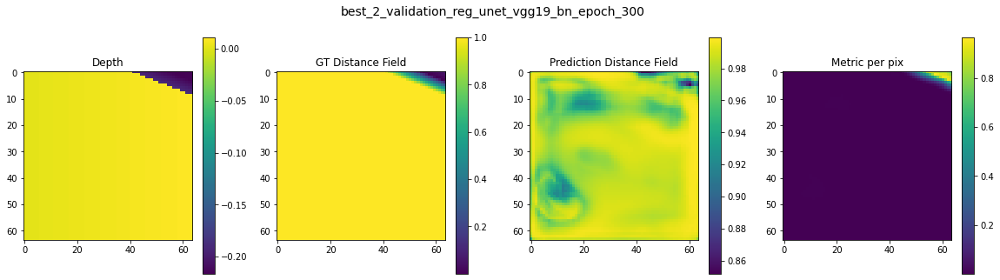

In [99]:
i = 2
min_tg_tmp = torch.FloatTensor(min_tg[i]).unsqueeze(0)
min_depth_tmp = torch.FloatTensor(min_depths[i])
prediction = get_predictions(min_depth_tmp.unsqueeze(0), min_tg_tmp.unsqueeze(0))
metric = metric_per_pix(min_tg_tmp[0].cpu().numpy(), prediction.cpu().numpy(), 2)
illustrate_results(min_depth_tmp[0], min_tg_tmp[0].cpu().numpy(), (prediction).cpu().numpy(), metric, name_plot='best_{}_validation_{}_epoch_{}'.format(i, cfg['name'], epoch))


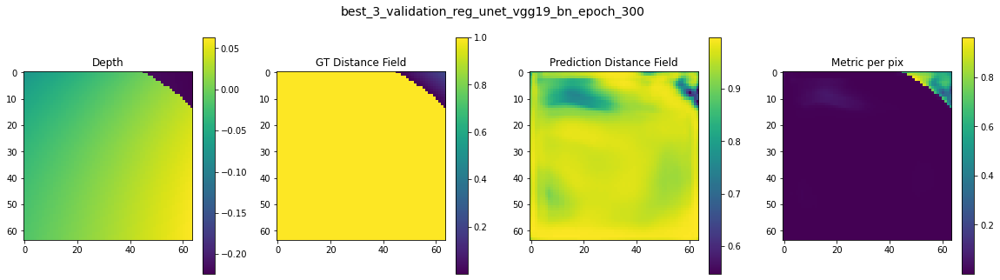

In [100]:
i = 3
min_tg_tmp = torch.FloatTensor(min_tg[i]).unsqueeze(0)
min_depth_tmp = torch.FloatTensor(min_depths[i])
prediction = get_predictions(min_depth_tmp.unsqueeze(0), min_tg_tmp.unsqueeze(0))
metric = metric_per_pix(min_tg_tmp[0].cpu().numpy(), prediction.cpu().numpy(), 2)
illustrate_results(min_depth_tmp[0], min_tg_tmp[0].cpu().numpy(), (prediction).cpu().numpy(), metric, name_plot='best_{}_validation_{}_epoch_{}'.format(i, cfg['name'], epoch))


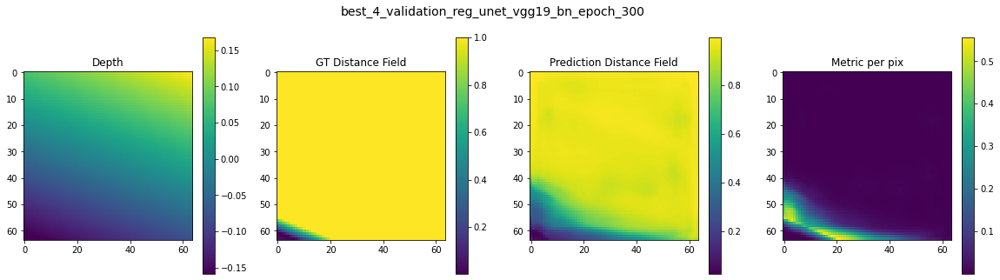

In [101]:
i = 4
min_tg_tmp = torch.FloatTensor(min_tg[i]).unsqueeze(0)
min_depth_tmp = torch.FloatTensor(min_depths[i])
prediction = get_predictions(min_depth_tmp.unsqueeze(0), min_tg_tmp.unsqueeze(0))
metric = metric_per_pix(min_tg_tmp[0].cpu().numpy(), prediction.cpu().numpy(), 2)
illustrate_results(min_depth_tmp[0], min_tg_tmp[0].cpu().numpy(), (prediction).cpu().numpy(), metric, name_plot='best_{}_validation_{}_epoch_{}'.format(i, cfg['name'], epoch))


## worst images

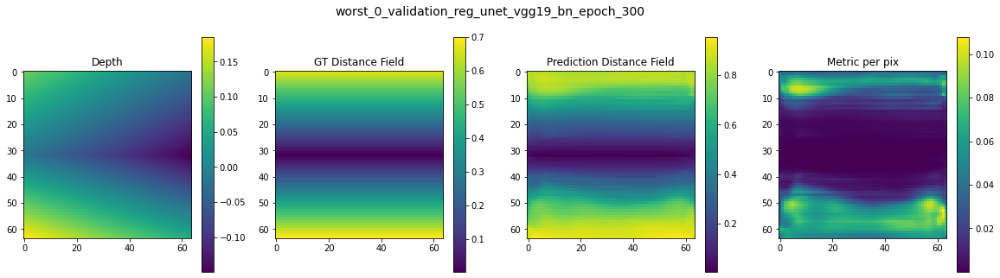

In [102]:
i = 0
max_tg_tmp = torch.FloatTensor(max_tg[i]).unsqueeze(0)
max_depth_tmp = torch.FloatTensor(max_depths[i])
prediction = get_predictions(max_depth_tmp.unsqueeze(0), max_tg_tmp.unsqueeze(0))
metric = metric_per_pix(max_tg_tmp[0].cpu().numpy(), prediction.cpu().numpy(), 2)
illustrate_results(max_depth_tmp[0], max_tg_tmp[0].cpu().numpy(), (prediction).cpu().numpy(), metric, name_plot='worst_{}_validation_{}_epoch_{}'.format(i, cfg['name'], epoch))


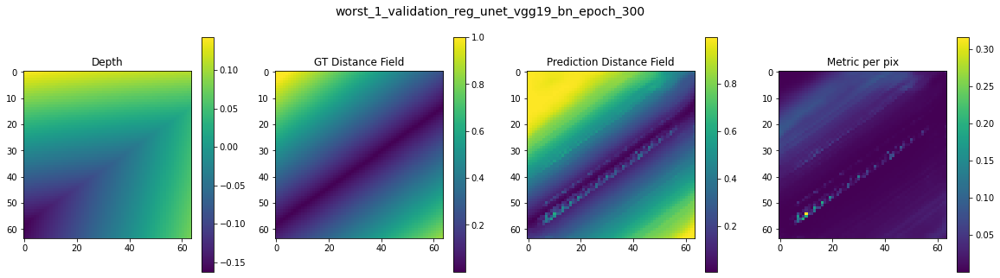

In [103]:
i = 1
max_tg_tmp = torch.FloatTensor(max_tg[i]).unsqueeze(0)
max_depth_tmp = torch.FloatTensor(max_depths[i])
prediction = get_predictions(max_depth_tmp.unsqueeze(0), max_tg_tmp.unsqueeze(0))
metric = metric_per_pix(max_tg_tmp[0].cpu().numpy(), prediction.cpu().numpy(), 2)
illustrate_results(max_depth_tmp[0], max_tg_tmp[0].cpu().numpy(), (prediction).cpu().numpy(), metric, name_plot='worst_{}_validation_{}_epoch_{}'.format(i, cfg['name'], epoch))


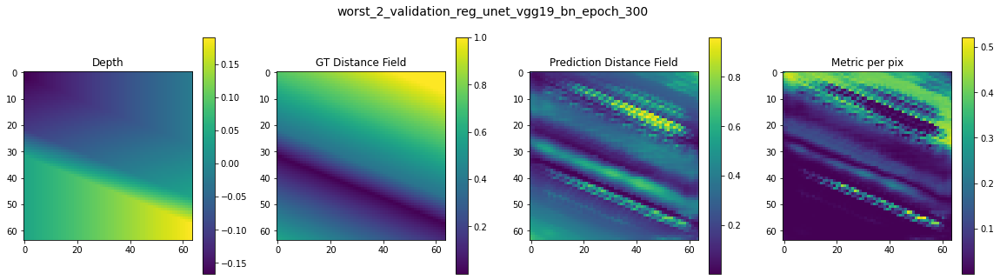

In [104]:
i = 2
max_tg_tmp = torch.FloatTensor(max_tg[i]).unsqueeze(0)
max_depth_tmp = torch.FloatTensor(max_depths[i])
prediction = get_predictions(max_depth_tmp.unsqueeze(0), max_tg_tmp.unsqueeze(0))
metric = metric_per_pix(max_tg_tmp[0].cpu().numpy(), prediction.cpu().numpy(), 2)
illustrate_results(max_depth_tmp[0], max_tg_tmp[0].cpu().numpy(), (prediction).cpu().numpy(), metric, name_plot='worst_{}_validation_{}_epoch_{}'.format(i, cfg['name'], epoch))


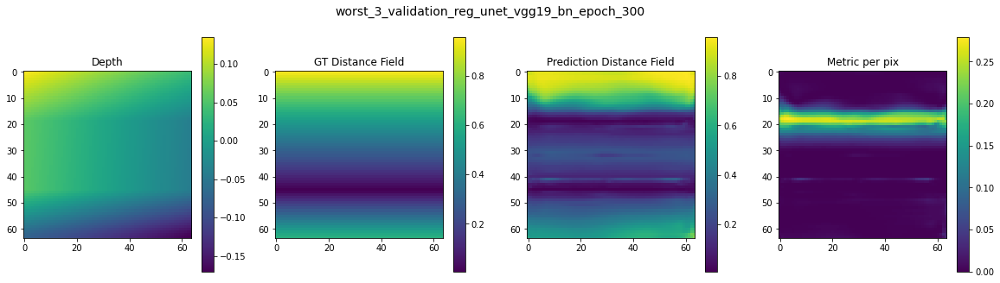

In [105]:
i = 3
max_tg_tmp = torch.FloatTensor(max_tg[i]).unsqueeze(0)
max_depth_tmp = torch.FloatTensor(max_depths[i])
prediction = get_predictions(max_depth_tmp.unsqueeze(0), max_tg_tmp.unsqueeze(0))
metric = metric_per_pix(max_tg_tmp[0].cpu().numpy(), prediction.cpu().numpy(), 2)
illustrate_results(max_depth_tmp[0], max_tg_tmp[0].cpu().numpy(), (prediction).cpu().numpy(), metric, name_plot='worst_{}_validation_{}_epoch_{}'.format(i, cfg['name'], epoch))


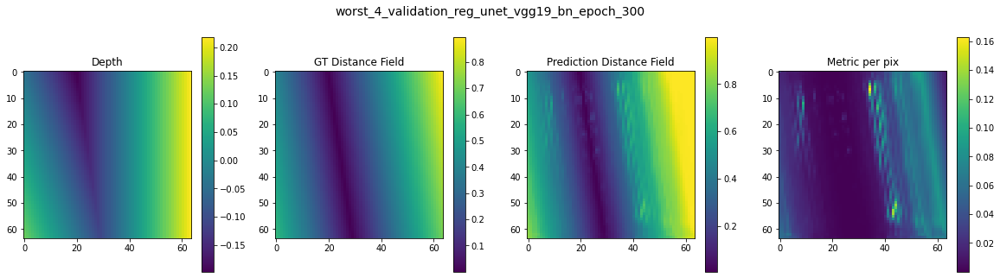

In [106]:
i = 4
max_tg_tmp = torch.FloatTensor(max_tg[i]).unsqueeze(0)
max_depth_tmp = torch.FloatTensor(max_depths[i])
prediction = get_predictions(max_depth_tmp.unsqueeze(0), max_tg_tmp.unsqueeze(0))
metric = metric_per_pix(max_tg_tmp[0].cpu().numpy(), prediction.cpu().numpy(), 2)
illustrate_results(max_depth_tmp[0], max_tg_tmp[0].cpu().numpy(), (prediction).cpu().numpy(), metric, name_plot='worst_{}_validation_{}_epoch_{}'.format(i, cfg['name'], epoch))


In [ ]:
import torch
preds_reg, preds_seg = estimated_pred[0], estimated_pred[1]
gt_reg, gt_seg = tg[0], tg[1]
ones_tensor = torch.ones(preds_reg.size(), device='cuda')
preds_reg = preds_reg * preds_seg.round() + (ones_tensor - preds_seg.round())

In [14]:
prediction[0][0][0]

tensor([1.0313, 1.0423, 1.0312, 1.0259, 1.0334, 1.0325, 1.0311, 1.0285, 1.0294,
        1.0299, 1.0294, 1.0298, 1.0303, 1.0305, 1.0304, 1.0308, 1.0311, 1.0315,
        1.0311, 1.0307, 1.0305, 1.0309, 1.0309, 1.0320, 1.0308, 1.0295, 1.0294,
        1.0290, 1.0336, 1.0351, 1.0350, 1.0301, 1.0293, 1.0332, 1.0298, 1.0255,
        1.0289, 1.0332, 1.0399, 1.0335, 1.0297, 1.0341, 1.0333, 1.0318, 1.0274,
        1.0359, 1.0388, 1.0345, 1.0368, 1.0350, 1.0362, 1.0307, 1.0309, 1.0282,
        1.0278, 1.0283, 1.0269, 1.0308, 1.0302, 1.0262, 1.0245, 1.0358, 1.0343,
        1.0276], device='cuda:0')

In [ ]:
#mask_tg = torch.FloatTensor((tg > 0.15).float())
mask_pred = torch.nn.Sigmoid(torch.FloatTensor(prediction))
# metric = metric_per_pix(mask_tg, mask_pred, 2)
# illustrate_results(depth, mask_tg, mask_pred, metric, name_plot='Results_newloss_without_maskreg_overfit')

In [36]:
tg_numpy = tg.detach().cpu().numpy()[0]
estimated_pred_numpy = estimated_pred_reshaped.detach().cpu().numpy()[0]

In [37]:
metric = metric_per_pix_abs(tg_numpy, estimated_pred_numpy).reshape(-1)

In [38]:
np.mean(metric)

0.017287474

(-0.01, 1.0)

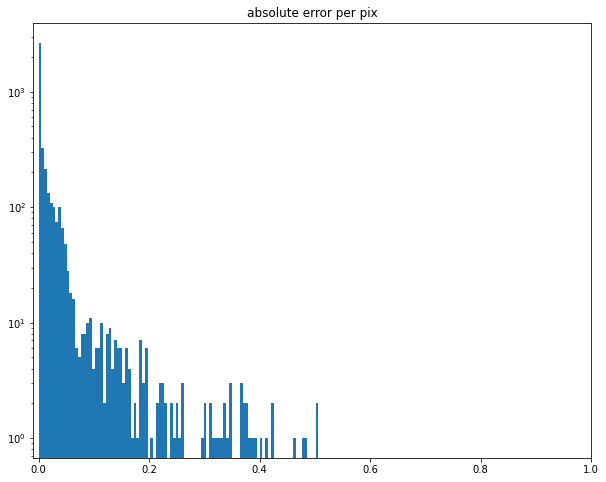

In [39]:
metric = metric_per_pix_abs(tg_numpy, estimated_pred_numpy).reshape(-1)
plt.figure(figsize=(10, 8))
plt.hist(metric, bins=100)
plt.yscale('log')
plt.title('absolute error per pix')
plt.xlim(-0.01,1)

In [27]:
from train_depths import mse_loss
loss = mse_loss()

In [28]:
tg.shape, estimated_pred_reshaped.shape

(torch.Size([1, 64, 64]), torch.Size([1, 64, 64]))

In [29]:
loss.forward(tg, estimated_pred_reshaped)

tensor(0.0007, device='cuda:0', grad_fn=<MeanBackward0>)

In [40]:
import numpy as np     
def show_field(field1,field2):

    combined_data = np.array([field1,field2])
    #Get the min and max of all your data
    _min, _max = np.amin(combined_data), np.amax(combined_data)

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(2, 1, 1)
    #Add the vmin and vmax arguments to set the color scale
    ax.imshow(field1,cmap=plt.cm.YlGn, vmin = _min, vmax = _max)
    ax.set_adjustable('box')
    ax.autoscale(False)
    ax2 = fig.add_subplot(2, 1, 2)
    ax2.set_adjustable('box')
    #Add the vmin and vmax arguments to set the color scale
    ax2.imshow(field2,cmap=plt.cm.YlGn, vmin = _min, vmax = _max)
    ax2.autoscale(False)
    plt.show()

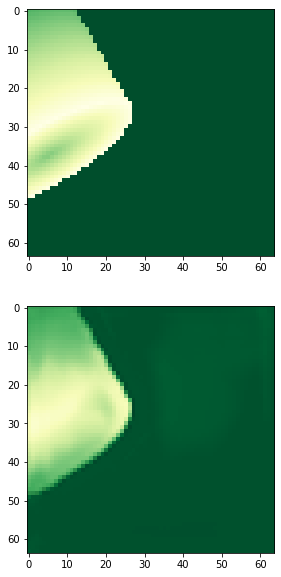

In [41]:
show_field(tg.numpy(), prediction)

TypeError: Invalid shape (64, 3, 3, 3) for image data

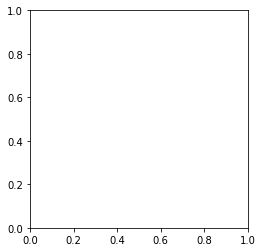

In [76]:
def plot_weights(model, layer_num, single_channel = True, collated = False):
  
    #extracting the model features at the particular layer number
    layer = model.features[layer_num]

    #checking whether the layer is convolution layer or not 
    if isinstance(layer, torch.nn.Conv2d):
    #getting the weight tensor data
        weight_tensor = model.features[layer_num].weight.data

        if single_channel:
            if collated:
                plot_filters_single_channel_big(weight_tensor)
            else:
                plot_filters_single_channel(weight_tensor)

        else:
            if weight_tensor.shape[1] == 3:
                plt.imshow(weight_tensor)
            else:
                print("Can only plot weights with three channels with single channel = False")

    else:
        print("Can only visualize layers which are convolutional")
        
#visualize weights for alexnet - first conv layer
plot_weights(model.encoder, 0, single_channel = False)

from train_depths import mse_loss

In [41]:
loss = mse_loss()

NameError: name 'mse_loss' is not defined

In [ ]:
loss(tg, pred, mask)

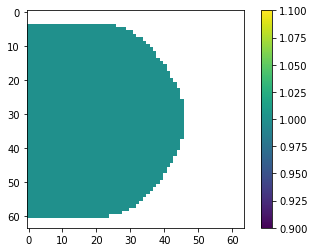

In [30]:
batch[0][0][-1][batch[0][0][-1] == 0.0] = np.nan
plt.imshow(batch[0][0][-1])
plt.colorbar()

In [31]:
np.isnan(batch[0][0][-1])

tensor([[1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        ...,
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1]], dtype=torch.uint8)

In [11]:
prediction[0][0][prediction[0][0] > 1]

tensor([], grad_fn=<IndexBackward>)

In [15]:
from train_depth import DepthHDF5Dataset
dataset = DepthHDF5Dataset(cfg['task'], args.data_dir, data_label, target_label, partition=None,
                 transform=transforms, target_transform=None, max_loaded_files=12, quality=quality)
dataset_size = len(dataset)

ModuleNotFoundError: No module named 'train_depth'

NameError: name 'imgs' is not defined

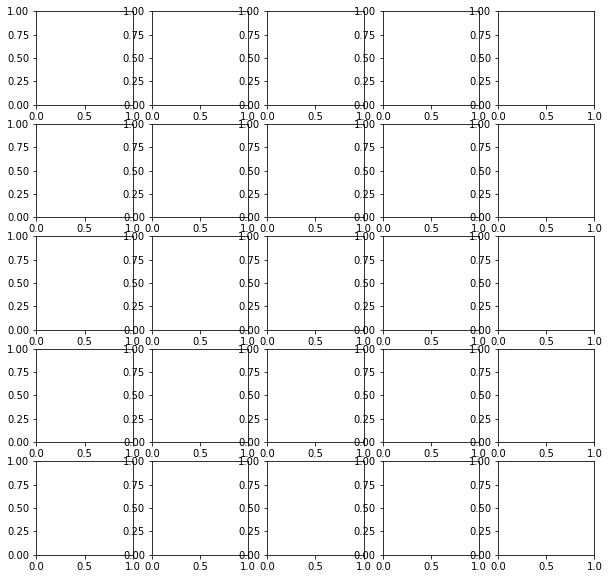

In [18]:

fig, axs = plt.subplots(5, 5, figsize=(10,10))
for i in range(5):
    for j in range(5):
        axs[i, j].imshow(imgs[i*5+j])
        



In [29]:
for dist in f['distances']:
    for i in dist.reshape(-1):
        distances.append(i)

In [14]:
dist = np.array(distances)
dist = dist[dist > 0.0]
dist = dist[dist < 1.0]

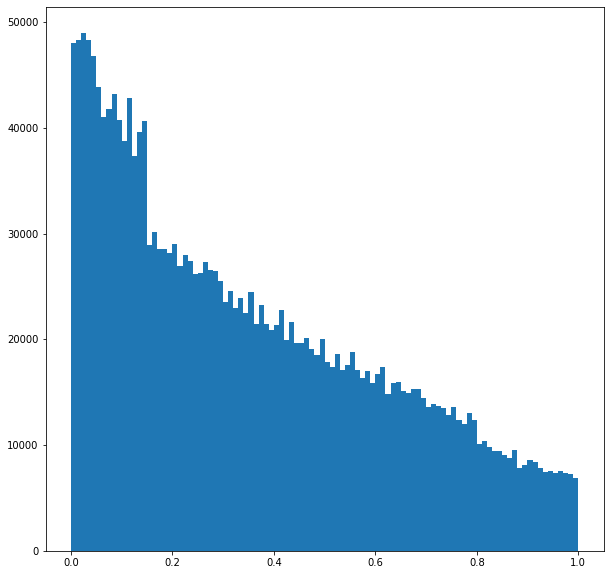

In [16]:
plt.figure(figsize=(10, 10))
plt.hist(dist, density=False, bins=100);


In [26]:
for image in f['image']:
    for i in image.reshape(-1, 1):
        depths.append(i[0])

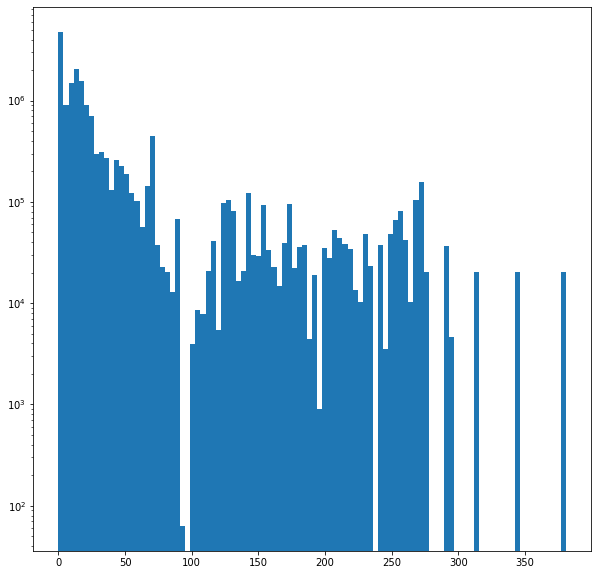

In [27]:
plt.figure(figsize=(10, 10))
plt.hist(np.array(depths), density=False, bins=100)
plt.yscale('log');

In [ ]:
plt.figure(figsize=(10, 10))
plt.hist(np.array(depths), density=False, bins=100)


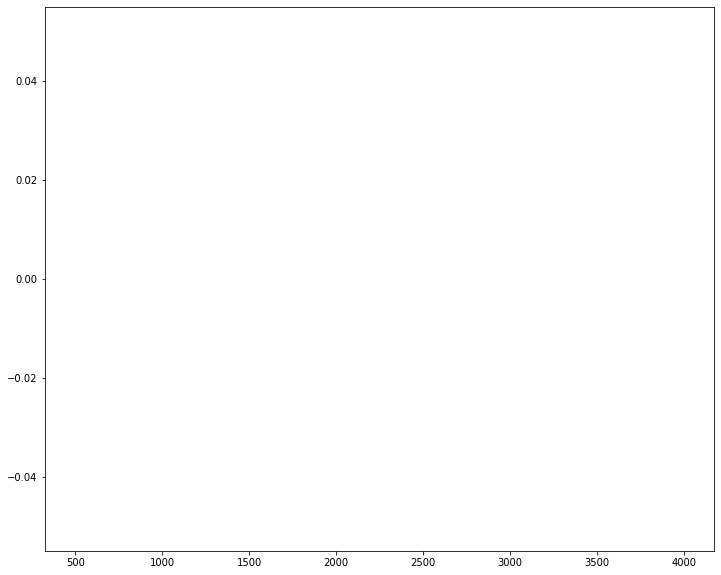

In [29]:
plt.figure(figsize=(12, 10))
max_depth = np.loadtxt('/gpfs/gpfs0/g.bobrovskih/quantile_64x64/max_depth.txt')
plt.hist(max_depth, density=False, bins=100, range=[500, 4000]);